# Data Preparation Workflow

This notebook demonstrates the data preparation workflow for the Snow Drought Index package. It covers loading data, preprocessing, station extraction and filtering, and data availability assessment.

In [1]:
# Install missing packages
#%pip install bottleneck
#%pip install git+https://github.com/Nadiesenali/snowdroughtindex-main   # Install snowdroughtindex from the local source directory
#%pip install --force-reinstall git+https://github.com/Nadiesenali/snowdroughtindex-main

# Import required packages
import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from shapely.geometry import Point
import sys
from sklearn.metrics import mean_squared_error
import datetime
from pathlib import Path
from scipy.interpolate import interp1d
import random

# Add project root to path
project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))


# Import snowdroughtindex package
from snowdroughtindex.core import data_preparation

First, we'll load the SWE data and other required datasets.

In [2]:
# Define data paths
canswe_path = project_root / 'data' / 'input_data' /'CanSWE'/'CanSWE-CanEEN_1928-2024_v7.nc'
casr_input_data = project_root / 'data' / 'output_data' / 'merged_2d' / '1980_2024'/'bow_combined_full_data.csv'
basin_path = project_root / 'data' / 'input_data' / 'shapefiles'/'BowRiverBasin'/'Bow_elevation_combined.shp'
output_data = project_root / 'data' /'output_data'/'for_paper'/'FROSTBITE'
output_plots = project_root / 'data' /'output_plots'/'for_paper'/'FROSTBITE'

In [3]:
# Load data using the implemented functions
canswe = data_preparation.load_swe_data(canswe_path)
casr_data = pd.read_csv(casr_input_data)
bow_basin = data_preparation.load_basin_data(basin_path)

In [28]:
print(bow_basin.head())

  PROVCD_1   VALDATE EDITION DATASETNAM VERSION COMPLEVEL WSCMDA WSCSDA  \
0       AB  20070208       1    05BM000       0   NHN-CL1     05    05B   
1       AB  20070130       1    05BN000       0   NHN-CL1     05    05B   
2       AB  20070226       1    05BH000       0   NHN-CL1     05    05B   
3       AB  20070228       1    05BK000       0   NHN-CL1     05    05B   
4       AB  20070302       1    05BE000       0   NHN-CL1     05    05B   

  WSCSSDA   FDA  ...     min     max         mean    count         std  \
0    05BM  05BM  ...   776.0  1177.0   953.688214  9897452   71.132927   
1    05BN  05BN  ...   700.0   998.0   772.376015  9312616   32.852467   
2    05BH  05BH  ...  1038.0  2479.0  1259.913722  4121228  176.434021   
3    05BK  05BK  ...   981.0  1777.0  1226.170423  1151005  126.086335   
4    05BE  05BE  ...  1146.0  3054.0  1601.837836  1655101  376.052387   

   median  PROVCD_2  elev_class  \
0   944.0       NaN   500_1000m   
1   764.0       NaN   500_1000m   

# Extract CanSWE data for stations within the Bow basin

In [40]:
# Get station locations from canswe
stations_df = pd.DataFrame({
	'station_id': canswe['station_id'].values,
	'lat': canswe['lat'].values,
	'lon': canswe['lon'].values,
    'elevation': canswe['elevation'].values,
    'SWE': canswe['snw'].values,
    'time': canswe['time'].values
})

# Create Point geometries for each station
stations_gdf = gpd.GeoDataFrame(
	stations_df,
	geometry=gpd.points_from_xy(stations_df['lon'], stations_df['lat']),
	crs=bow_basin.crs
)

# Find stations within any of the Bow basin polygons
stations_in_basin = stations_gdf[stations_gdf.within(bow_basin.unary_union)]

# Select these stations from canswe
bow_canswe = canswe.sel(station_id=stations_in_basin['station_id'].values)

# Convert to DataFrame
#bow_canswe_df = bow_canswe.to_dataframe().reset_index()

# Save the extracted data to a nc file
#bow_canswe.to_netcdf(output_data / 'bow_canswe.nc')

display(stations_in_basin)


ValueError: Per-column arrays must each be 1-dimensional

In [ ]:
# Add Elevation_Category column to combined_canswe based on elevation
def categorize_elevation(elevation):
    if pd.isna(elevation):
        return None
    elif 500 <= elevation < 1000:
        return '500_1000m'
    elif 1000 <= elevation < 1500:
        return '1000_1500m'
    elif 1500 <= elevation < 2000:
        return '1500_2000m'
    elif 2000 <= elevation < 2500:
        return '2000_2500m'
    else:
        return None

stations_in_basin['Elevation_Category'] = stations_in_basin['elevation'].apply(categorize_elevation)
#drop rows where elevation<1500m
stations_in_basin = stations_in_basin[~stations_in_basin['Elevation_Category']. isin(['500_1000m', '1000_1500m'])]

display(stations_in_basin)

,station_id,lat,lon,elevation,geometry,Elevation_Category
14,ALE-05BA811,51.700001,-116.466667,2080.0,POINT (-116.46667 51.70000),2000_2500m
15,ALE-05BL801,50.599998,-114.983330,2210.0,POINT (-114.98333 50.60000),2000_2500m
16,ALE-05BL808,50.483334,-114.866669,1860.0,POINT (-114.86667 50.48333),1500_2000m
275,BCE-AL04,50.566666,-114.949997,2070.0,POINT (-114.95000 50.56667),2000_2500m
567,SCD-AL016,50.916668,-114.583336,1524.0,POINT (-114.58334 50.91667),1500_2000m
...,...,...,...,...,...,...
1836,ALE-05BF824P,50.632683,-115.281235,2160.0,POINT (-115.28123 50.63268),2000_2500m
1837,ALE-05BJ805P,50.705486,-114.990013,2120.0,POINT (-114.99001 50.70549),2000_2500m
1838,ALE-05BL811P,50.170414,-114.714371,2130.0,POINT (-114.71437 50.17041),2000_2500m
1839,ALE-05BL812P,50.485649,-114.914162,2060.0,POINT (-114.91416 50.48565),2000_2500m


KeyError: 'time'

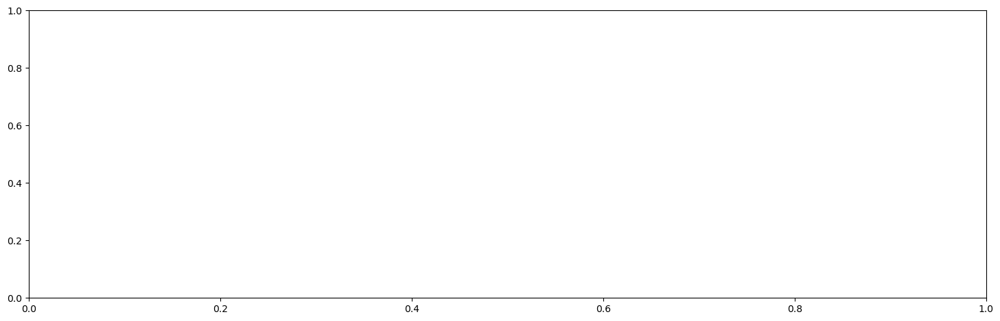

In [38]:
# Plot time series for each elevation category comparing Original_SWE and Gap_filled_SWE
elev_categories = [ '1500_2000m', '2000_2500m']

plt.figure(figsize=(18, 12))
for i, elev_cat in enumerate(elev_categories, 1):
    plt.subplot(len(elev_categories), 1, i)

    # Filter data for the current elevation category and sort by time
    df_cat = stations_in_basin.loc[stations_in_basin['Elevation_Category'] == elev_cat].sort_values('time')

    # Plot Gap-filled SWE (x and y have matching lengths)
    plt.plot(
        df_cat['time'],
        df_cat['Gap_Filled_CanSWE'],
        label='Gap-filled SWE',
        color='tab:blue',
        alpha=0.7
    )

    # Plot Original SWE (x and y have matching lengths)
    plt.plot(
        df_cat['time'],
        df_cat['Original_CanSWE'],
        label='Original SWE',
        color='tab:orange',
        alpha=0.7
    )

    plt.title(f'Time Series Comparison for Elevation Category: {elev_cat}')
    plt.xlabel('Date')
    plt.ylabel('SWE (mm)')
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Extract CaSRv3.1 SWE data within the Bow basin

In [5]:
# CaSR dataframe
casr_df = pd.DataFrame(casr_data)

# kee SWE, 'date', 'Grid_id', 'Elevation_category
casr_df = casr_df[['time', 'Grid_id','lat', 'lon', 'Elevation_Category','SWE']]

display(casr_df.head())


,time,Grid_id,lat,lon,Elevation_Category,SWE
0,1980-10-10,1,51.3346,-116.1380,2000_2500m,0.878418
1,1982-07-19,1,51.3346,-116.1380,2000_2500m,0.515625
2,1983-10-12,2,51.4191,-116.1875,2000_2500m,6.875000
3,1980-12-11,2,51.4191,-116.1875,2000_2500m,118.125000
4,1981-07-21,2,51.4191,-116.1875,2000_2500m,0.000000


In [15]:
# drop rows where Elevation_category = 500_1000m and 1000_1500m
casr_df = casr_df[~casr_df['Elevation_Category'].isin(['500_1000m', '1000_1500m'])]
display(casr_df['Elevation_Category'].unique())

array(['2000_2500m', '1500_2000m'], dtype=object)

In [16]:
# convert to geodataframe
casr_gdf = gpd.GeoDataFrame(
    casr_df,
    geometry=gpd.points_from_xy(casr_df['lon'], casr_df['lat']),
    crs=bow_basin.crs
)
display(casr_gdf.head())

,time,Grid_id,lat,lon,Elevation_Category,SWE,geometry
0,1980-10-10,1,51.3346,-116.1380,2000_2500m,0.878418,POINT (-116.13800 51.33460)
1,1982-07-19,1,51.3346,-116.1380,2000_2500m,0.515625,POINT (-116.13800 51.33460)
2,1983-10-12,2,51.4191,-116.1875,2000_2500m,6.875000,POINT (-116.18750 51.41910)
3,1980-12-11,2,51.4191,-116.1875,2000_2500m,118.125000,POINT (-116.18750 51.41910)
4,1981-07-21,2,51.4191,-116.1875,2000_2500m,0.000000,POINT (-116.18750 51.41910)


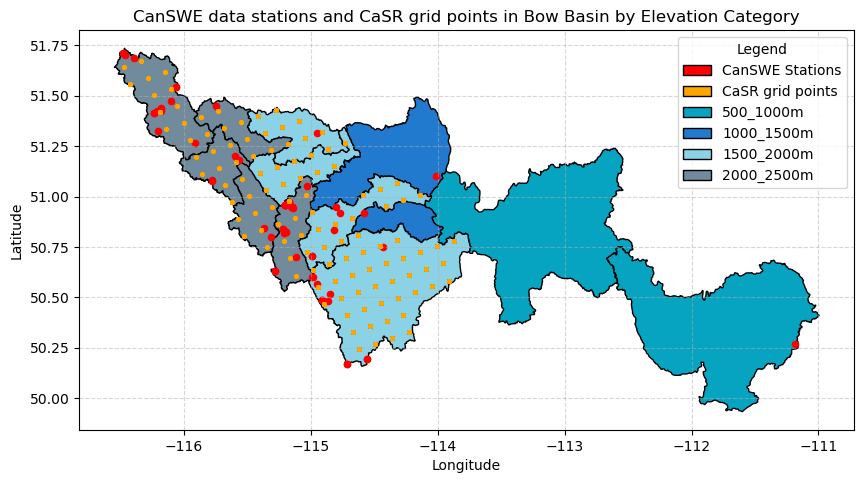

In [17]:
from matplotlib.patches import Patch

# Plot Bow basin polygons colored by elevation category
fig, ax = plt.subplots(figsize=(10, 10))

# Create elevation class column based on 'mean' elevation
bins = [500, 1000, 1500, 2000, 2500]
labels = ['500_1000m', '1000_1500m', '1500_2000m', '2000_2500m']
bow_basin['elev_class'] = pd.cut(bow_basin['mean'], bins=bins, labels=labels, include_lowest=True, right=False)

# Ensure elev_class is a categorical type with desired order
bow_basin['elev_class'] = pd.Categorical(
    bow_basin['elev_class'],
    categories=labels,
    ordered=True
)
elevation_colors = {'500_1000m': "#06a4c0", '1000_1500m': "#217ace", '1500_2000m': "#8bd2e7", '2000_2500m': "#728B9C"}
# Map categorical classes to explicit colors and plot
bow_basin['elev_color'] = bow_basin['elev_class'].map(elevation_colors)
# Plot polygons colored by elevation class (remove imshow which expects 2D image data)
bow_basin.plot(ax=ax, color=bow_basin['elev_color'], edgecolor='black')
# Add station points
stations_in_basin.plot(ax=ax, color='red', markersize=20, label='CanSWE Stations')
casr_gdf.plot(ax=ax, color='orange', markersize=5, label='CaSR grid points')
ax.set_title('CanSWE data stations and CaSR grid points in Bow Basin by Elevation Category')
ax.grid(True, linestyle='--', alpha=0.5)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
# Build a single combined legend for stations and elevation categories
station_handles = [
    Patch(facecolor='red', edgecolor='black', label='CanSWE Stations'),
    Patch(facecolor='orange', edgecolor='black', label='CaSR grid points'),
]
elevation_patches = [Patch(facecolor=elevation_colors[label], edgecolor='black', label=label) for label in labels]
ax.legend(handles=station_handles + elevation_patches, loc='upper right', title='Legend')
plt.savefig(str(output_plots / 'bow_basin_by_elev_class.png'), dpi=300)
plt.show()

## 1. FROSTBYTE gap filling

FROSTBYTE workflow  (In the original workflow, SCDNA precipitation data were also used to increase the data availability. However, here I'm only using CanSWE data because I couldn't find compatible precipitation dataset for the time period 1980-2024)

In [9]:
# Set user-specified variables
flag_buffer_default, buffer_km_default = 0, 0 # buffer flag (0: no buffer around test basin, 1: buffer of value buffer_default around test basin) and buffer default value in km to be applied if flag = 1
month_start_water_year_default, day_start_water_year_default = 10, 1  # water year start
month_end_water_year_default, day_end_water_year_default = 9, 30  # water year end
min_obs_corr_default = 3 # the minimum number of overlapping observations required to calculate the correlation between 2 stations
min_obs_cdf_default = 10 # the minimum number of observations required to calculate a station's cdf
min_corr_default = 0.6 # the minimum correlation value required for donor stations to be selected
window_days_default = 7 # the number of days used on either side of the infilling date for gap filling calculations
min_obs_KGE_default = 3 # the minimum number of observations required to calculate the KGE''
max_gap_days_default = 15  # max. number of days for gaps allowed in the daily SWE data for the linear interpolation
artificial_gap_perc_default = 100 # the percentage of observations to remove during the artificial gap filling for each station & month's first day
iterations_default = 1 # the number of times we repeat the artificial gap filling
artificial_gap_filling_flag = 0 # indicates whether artificial gap filling is performed (1) or not (0)
artificial_gap_filling_basins = ['all'] # a list of the basin(s) to run the gap filling for. To include all basins simply write 'all'

In [10]:
def artificial_gap_filling(original_data, iterations, artificial_gap_perc, window_days, min_obs_corr, min_obs_cdf, min_corr, min_obs_KGE, flag):

    """Creating random artificial gaps in the original dataset for each month & station, and running the gap filling function to assess its performance.

    Keyword arguments:
    ------------------
    - original_data: Pandas DataFrame of original stations' observations dataset, to which data will be removed for artificial gap filling
    - iterations: Positive integer denoting the number of times we want to repeat the artificial gap filling (we remove data at random each time in the original dataset)
    - artificial_gap_perc: Percentage between 1 and 100 for the amount of data to remove for each station & month's first day
    - window_days: Positive integer denoting the number of days to select data for around a certain doy, to calculate correlations
    - min_obs_corr: Positive integer for the minimum number of overlapping observations required to calculate the correlation between 2 stations
    - min_obs_cdf: Positive integer for the minimum number of stations required to calculate a station's cdf
    - min_corr: Value between 0 and 1 for the minimum correlation value required to keep a donor station
    - min_obs_KGE: Positive integer for the minimum number of stations required to calculate a station's cdf
    - flag: Integer to plot the gap filled values vs the observed values (1) or not (0)

    Returns:
    --------
    - evaluation: Dictionary containing the artificial gap filling evaluation results for several metrics for each month's first day, station & iteration
    - fig (optional): A figure of the gap filled vs. the actual SWE observations for each first day of the month

    """
    # suppresses the "SettingWithCopyWarning"
    pd.set_option("mode.chained_assignment", None)

    # Set up the figure
    if flag == 1:
        ncols = 3
        fig, axs = plt.subplots(4, ncols, sharex=False, sharey=False, figsize=(8,10))
        plot_col = -1
        row = 0

    # Identify stations for gap filling (without P & external SWE stations (buffer) as we don't do any gap filling for these)
    cols = [c for c in original_data.columns if 'precip' not in c and 'ext' not in c]

    # Create an empty dictionary to store the metric values for each month, station & iteration
    evaluation = {}
    metrics = ['RMSE', "KGE''", "KGE''_corr", "KGE''_bias", "KGE''_var"]
    for m in metrics:
        evaluation[m] = np.ones((12, len(cols), iterations)) * np.nan

    # Calculate correlations between stations that have overlapping observations
    corr = calculate_stations_doy_corr(original_data, window_days, min_obs_corr)

    # loop over months
    for mo in range(1,12+1):

        # controls for plotting on right subplot
        if flag == 1:
            plot_col += 1
            if plot_col == ncols:
                row += 1
                plot_col = 0

        # loop over iterations
        for i in range(iterations):

            # initialize counter to assign results to the right station
            elem = -1

            # looping over stations
            for s in cols:

                # update counter to assign results to the right station
                elem += 1

                # duplicate original data to create artificial gaps from this
                artificial_gaps_data = original_data.copy()

                # remove all missing values for a given station for which to perform gap filling
                station_nomissing_values = pd.DataFrame(artificial_gaps_data[s].dropna())

                # add DOY to select data to gap fill within a time window around first day of month
                station_nomissing_values['doy'] = station_nomissing_values.index.dayofyear

                # calculate the doy corresponding to the date - using 2010 as common year (not leap year)
                doy = int(datetime.datetime(2010,mo,1).strftime('%j'))

                # calculate the start & end doys of the time window for quantile mapping, with caution around the start & end of the calendar year
                window_startdoy = (doy-window_days)%365
                window_startdoy = 365 if window_startdoy == 0 else window_startdoy
                window_enddoy = (doy+window_days)%365
                window_enddoy = 366 if window_enddoy == 0 or window_enddoy == 365 else window_enddoy

                # select data within time window
                if window_startdoy > window_enddoy:
                    data_window = station_nomissing_values[(station_nomissing_values['doy']>=window_startdoy) | (station_nomissing_values['doy'] <= window_enddoy)]
                else:
                    data_window = station_nomissing_values[(station_nomissing_values['doy']>=window_startdoy) & (station_nomissing_values['doy'] <= window_enddoy)]

                # Select target data within this time window
                data_window_target = data_window[s]

                # calculate the number of observations to remove for this station & month's first day
                n = int(len(data_window.index) * artificial_gap_perc / 100)

                # if the number of observations is above zero we can proceed with the gap filling
                if n > 0:

                    # randomly select n dates from the station's data (no duplicates) and remove them from the original dataset - if 100% is removed then all dates will be selected
                    if artificial_gap_perc == 100:
                        dates_to_remove = data_window.index
                    else:
                        dates_to_remove = data_window.index[random.sample(range(0, len(data_window.index)), n)]
                    artificial_gaps_data[s].loc[dates_to_remove] = np.nan
                    artificial_gaps_data = artificial_gaps_data.loc[dates_to_remove]

                    # Keep only SWE station to gap fill
                    gapfilled_data = artificial_gaps_data[s].copy()

                    # Identify dates for gap filling
                    time_index = data_window.dropna().index

                    # Loop over dates for gap filling
                    for d in time_index:

                        # Get the doy corresponding to the date
                        doy = data_window.dropna().loc[d,'doy']

                        # Get IDs of all stations with data for this date (and within time window)
                        data_window_allstations = artificial_gaps_data.dropna(axis=1, how='all')
                        non_missing_stations = [c for c in data_window_allstations.columns]
                        data_window_allstations['days_to_date'] = abs((d - data_window_allstations.index).days)

                        # We can continue if there are enough target data to build cdf
                        if len(data_window_target.index) >= min_obs_cdf:

                            # Get ids of all stations with correlations >= a minimum correlation for this doy, not including the target station itself
                            non_missing_corr = corr[doy][s].dropna()
                            non_missing_corr = non_missing_corr[non_missing_corr.index.isin(non_missing_stations)]
                            potential_donor_stations = non_missing_corr[non_missing_corr >= min_corr].index.values
                            potential_donor_stations = [c for c in potential_donor_stations if s not in c]

                            # If there is at least one potential donor station, proceed
                            if len(potential_donor_stations) > 0:

                                # Sort the donor stations from highest to lowest value
                                potential_donor_stations_sorted = corr[doy].loc[potential_donor_stations,s].dropna().sort_values(ascending=False).index.values

                                # Loop over sorted donor stations until I find one with enough data to build a cdf
                                for donor_station in potential_donor_stations_sorted:

                                    # Select data within time window for this doy from all years
                                    data_window_donor = data_window_allstations[donor_station].dropna()

                                    # We can continue if there are enough donor data to build cdf
                                    if len(data_window_donor.index) >= min_obs_cdf:

                                        # If the donor station has multiple values within the window, we keep the closest donor station value to the date we are gap filling
                                        sorted_data_window = data_window_allstations.sort_values(by=['days_to_date'])
                                        value_donor = sorted_data_window[donor_station].dropna()[0]

                                        # Perform the gap filling using quantile mapping
                                        value_target = quantile_mapping(data_window_donor, data_window_target, value_donor, min_obs_cdf, flag=0)

                                        if value_target != None:
                                            gapfilled_data.loc[d] = value_target

                                        break

                                    else:
                                        continue

                    # combine observed & predicted data into a single Pandas dataframe
                    # results = gapfilled_data[s].loc[dates_to_remove]
                    results = gapfilled_data.to_frame(name='pre')
                    results['obs'] = original_data[s].loc[dates_to_remove]
                    results = results.dropna()

                    # plot the gap filled vs the observed values
                    if flag == 1:
                        axs[row,plot_col].scatter(results['obs'], results['pre'], color='b', alpha=.3)
                        axs[row,plot_col].set_title('month'+str(mo))
                        if row == 3 and plot_col == 0:
                            axs[row,plot_col].set_xlabel('observed')
                            axs[row,plot_col].set_ylabel('infilling')

                    # if there are no predicted values set the metrics to nan
                    if results.empty == True:
                        for m in metrics:
                            evaluation[m][mo-1,elem,i] = np.nan

                    # otherwise proceed with evaluating the gap filling performance
                    else:
                        rmse = mean_squared_error(results['obs'], results['pre'], squared=False)
                        kge_prime_prime = KGE_Tang2021(results['obs'].values, results['pre'].values, min_obs_KGE)
                        evaluation['RMSE'][mo-1,elem,i] = rmse
                        evaluation["KGE''"][mo-1,elem,i] = kge_prime_prime['KGE']
                        evaluation["KGE''_corr"][mo-1,elem,i] = kge_prime_prime['r']
                        evaluation["KGE''_bias"][mo-1,elem,i] = kge_prime_prime['beta']
                        evaluation["KGE''_var"][mo-1,elem,i] = kge_prime_prime['alpha']

                # else if the number of observations is zero we go to the next station
                else:
                    continue

    if flag == 1:
        plt.tight_layout()
        return evaluation, fig

    else:
        return evaluation

###

def KGE_Tang2021(obs, pre, min_obs_KGE):

    """Calculates the modified Kling-Gupta Efficiency (KGE") and its 3 components.
    The KGE measures the correlation, bias and variability of the simulated values against the observed values.
    KGE" was proposed by Tang et al. (2021) to solve issues arising with 0 values in the KGE or KGE'.
    For more info, see https://doi.org/10.1175/jcli-d-21-0067.1
    KGE" range: -Inf to 1. Perfect score: 1. Units: Unitless.
    Correlation (r): Perfect score is 1.
    Bias ratio (beta): Perfect score is 0.
    Variability ratio (alpha):  Perfect score is 1.

    Keyword arguments:
    ------------------
    - obs: Numpy Array of observations to evaluate
    - pre: Numpy Array of predictions/simulations to evaluate
    - min_obs_KGE: Positive integer for the minimum number of stations required to calculate a station's cdf

    Returns:
    --------
    - KGEgroup: Dictionary containing the final KGE'' value as well as all elements of the KGE''

    """

    ind_nan = np.isnan(obs) | np.isnan(pre)
    obs = obs[~ind_nan]
    pre = pre[~ind_nan]

    if len(obs) >= min_obs_KGE:

        pre_mean = np.mean(pre, axis=0, dtype=np.float64)
        obs_mean = np.mean(obs, axis=0, dtype=np.float64)
        pre_std = np.std(pre, axis=0)
        obs_std = np.std(obs, dtype=np.float64)

        # Check to see if all forecast values are the same. If they are r cannot be calculated and is set to 0
        # For more info: https://doi.org/10.5194/hess-23-4323-2019 (Section 2)
        if pre_std == 0:

            r = 0

        else:

            r = np.sum((pre - pre_mean) * (obs - obs_mean), axis=0, dtype=np.float64) / \
                np.sqrt(np.sum((pre - pre_mean) ** 2, axis=0, dtype=np.float64) *
                        np.sum((obs - obs_mean) ** 2, dtype=np.float64))

        alpha = pre_std / obs_std

        beta = (pre_mean - obs_mean) / obs_std

        KGE = 1 - np.sqrt((r - 1) ** 2 + (alpha - 1) ** 2 + (beta) ** 2)

        KGEgroup = {'KGE': KGE, 'r': r, 'alpha': alpha, 'beta': beta}

    else:

        KGEgroup = {'KGE': np.nan, 'r': np.nan, 'alpha': np.nan, 'beta': np.nan}

    return KGEgroup

###
def data_availability_monthly_plots_1(SWE_stations, original_SWE_data, gapfilled_SWE_data, flag):

    """Calculating and plotting the % of SWE stations available on the first day of each month of each year.

    Keyword arguments:
    ------------------
    - SWE_stations: Pandas GeoDataFrame of all SWE stations
    - original_SWE_data: xarray DataArray of the original SWE observations
    - gapfilled_SWE_data: xarray DataArray of the SWE observations after gap filling
    - flag: Flag to indicate if gap filled data was provided (1) or not (0). In the case that it is provided, a comparison plot will be made to compare data availability in the original data vs the gap filled data

    Returns:
    --------
    - Bar chart timeseries of SWE stations available on the first day of each month of each year

    """

    # Initialize plot
    fig, axs = plt.subplots(6, 2, sharex=True, sharey=True, figsize=(14,8))
    elem = -1
    column = 0

    # Loop over months
    for m in range(1,12+1):

        # controls for plotting on right subplot (i.e., month)
        elem += 1
        if elem == 6:
            column += 1
            elem = 0

        # for SWE data with gap filling
        if flag == 1:

            # extract data on the first of the month m
            data_month_gapfilled = gapfilled_SWE_data.sel(station_id=SWE_stations.station_id.values, time=( (gapfilled_SWE_data['time.month'] == m) & (gapfilled_SWE_data['time.day'] == 1) ))

            # count the % of stations with data on those dates
            data_month_gapfilled_count = data_month_gapfilled.count(dim='station_id') / len(SWE_stations) * 100

            # plot bar chart of available data
            axs[elem,column].bar(data_month_gapfilled_count['time.year'], data_month_gapfilled_count.data, color='r', alpha=.5)

        # same process as above but for original SWE data
        data_month = original_SWE_data.sel(station_id=SWE_stations.station_id.values, time=( (original_SWE_data['time.month'] == m) & (original_SWE_data['time.day'] == 1) ))
        data_month_count = data_month.count(dim='station_id') / len(SWE_stations) * 100
        axs[elem,column].bar(data_month_count['time.year'], data_month_count.data, color='b')

        # add plot labels
        if elem == 5 and column == 0:
            axs[elem,column].set_ylabel('% of SWE stations \n with data in basin')
        month_name = datetime.datetime.strptime(str(m), "%m").strftime("%b")
        axs[elem,column].set_title('1st '+month_name, fontweight='bold')

        if flag == 1:
            bluepatch = mpatches.Patch(color='b', label='original data')
            redpatch = mpatches.Patch(color='r', alpha=.5, label='after gap filling')
            plt.legend(handles=[bluepatch, redpatch])

    plt.tight_layout()

    return fig

###

def data_availability_monthly_plots_2(SWE_data):

    """Creating bar chart subplots of the days with SWE observations around the 1st day of each month.

    Keyword arguments:
    ------------------
    - SWE_data: Pandas DataFrame containing the SWE stations observations

    Returns:
    --------
    - Bar chart subplots of the days with SWE observations around the 1st day of each month

    """

    # Initialize plot
    fig, axs = plt.subplots(6, 2, sharex=False, sharey=True, figsize=(8,16))
    elem = -1
    column = 0

    # Add day of year (doy) to test basin SWE observations Pandas DataFrame
    SWE_data_with_doy = SWE_data.copy()
    SWE_data_with_doy['doy'] = SWE_data_with_doy.index.dayofyear

    # Remove automatic stations as they distract the analysis
    manual_stations = [s for s in SWE_data_with_doy.columns if s[-1] != 'P']
    SWE_data_with_doy_manual = SWE_data_with_doy[manual_stations]

    # Define the doys of 1st of each month
    doys_first_month = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]

    # Loop over months
    for m in range(1,12+1):

        # controls for plotting on right subplot
        elem += 1
        if elem == 6:
            column += 1
            elem = 0

        # calculate the start & end of the data selection window, with caution around the start & end of the calendar year
        window_start = (doys_first_month[m-1]-15)%366
        if window_start == 0:
            window_start = 365
        window_end = (doys_first_month[m-1]+15)%366
        if window_end == 0 or window_end == 365:
            window_end = 366

        # select SWE observations within window
        if window_start > window_end:
            data_window = SWE_data_with_doy_manual[(SWE_data_with_doy_manual['doy']>=window_start) | (SWE_data_with_doy_manual['doy'] <= window_end)]
        else:
            data_window = SWE_data_with_doy_manual[(SWE_data_with_doy_manual['doy']>=window_start) & (SWE_data_with_doy_manual['doy'] <= window_end)]

        # drop dates or stations with no data at all
        data_window = data_window.dropna(axis=0, how='all')
        data_window = data_window.dropna(axis=1, how='all')

        # count total number of stations with data on each doy
        stations_cols = [c for c in data_window.columns if 'doy' not in c]
        data_stations_window = data_window[stations_cols]
        data_count_window = data_stations_window.count(axis=1)

        # create xticks to plot the data for each doy
        if window_start > window_end:
            xticks = list(np.arange(window_start,365+1))+list(np.arange(1,window_end+1))
        else:
            xticks = list(np.arange(window_start,window_end+1))
        xticks_plot = np.arange(len(xticks))

        # save the data for the right doy
        data_count_plot = [0]*len(xticks)
        for x in range(len(data_window.index)):
            doy = data_window.iloc[x]['doy']
            if doy == 366:
                doy = 365
            data_count_plot[xticks.index(doy)] += data_count_window.iloc[x]

        # plot data
        axs[elem,column].bar(xticks_plot, data_count_plot, color='b')
        axs[elem,column].set_xticks([xticks_plot[0],xticks_plot[15],xticks_plot[-1]])
        axs[elem,column].set_xticklabels([xticks[0],doys_first_month[m-1],xticks[-1]])

        # add plot labels
        if elem == 5 and column == 0:
            axs[elem,column].set_ylabel('# of SWE obs.')
            axs[elem,column].set_xlabel('DOY')

        if elem == 5 and column == 1:
            axs[elem,column].set_xlabel('DOY')

        month_name = datetime.datetime.strptime(str(m), "%m").strftime("%b")
        axs[elem,column].set_title('1st '+month_name+' +/- 15 days', fontweight='bold')

    plt.tight_layout()

    return fig

###
def calculate_stations_doy_corr(stations_obs, window_days, min_obs_corr):

    """Calculating stations' correlations for each day of the year (doy; with a X-day window centered around the doy).

    Keyword arguments:
    ------------------
    - stations_obs: Pandas DataFrame of all SWE & P stations observations
    - window_days: Positive integer denoting the number of days to select data for around a certain doy, to calculate correlations
    - min_obs_corr: Positive integer for the minimum number of overlapping observations required to calculate the correlation between 2 stations

    Returns:
    --------
    - stations_doy_corr: Dictionary containing a Pandas DataFrame of stations correlations for each day of year

    """

    # Set up the dictionary to save all correlations
    stations_doy_corr = {}

    # Duplicate the stations observations Pandas DataFrame and add doy column
    stations_obs_doy = stations_obs.copy()
    stations_obs_doy['doy'] = stations_obs_doy.index.dayofyear

    # Loop over days of the year
    for doy in range(1,366+1):

        # calculate the start & end of the data selection window, with caution around the start & end of the calendar year
        window_start = (doy-window_days)%366
        window_start = 366 if window_start == 0 else window_start
        window_end = (doy+window_days)%366
        window_end = 366 if window_end == 0 else window_end

        # select data for the window of interest
        if window_start > window_end:
            data_window = stations_obs_doy[(stations_obs_doy['doy']>=window_start) | (stations_obs_doy['doy'] <= window_end)]
        else:
            data_window = stations_obs_doy[(stations_obs_doy['doy']>=window_start) & (stations_obs_doy['doy'] <= window_end)]

        # calculate the Pearson product-moment correlations between stations if the minimum number of observations criterium is met
        data_window = data_window.drop(columns=['doy'])
        corr = data_window.corr(method='spearman', min_periods=min_obs_corr)
        # np.fill_diagonal(corr.values, np.nan)

        # save correlation for the doy to the dictionary
        stations_doy_corr[doy] = corr

    return stations_doy_corr

###

def qm_gap_filling(original_data, window_days, min_obs_corr, min_obs_cdf, min_corr):

    """Performing the gap filling for all missing observations (when possible) using quantile mapping.
    For each target station and each date for which date is missing, we identify a donor stations as the station with:
    - data for this date,
    - a cdf for this doy,
    - and the best correlation to the target station (correlation >= min_corr for this doy).

    Keyword arguments:
    ------------------
    - original_data: Pandas DataFrame of original stations' observations dataset, which will be gap filled
    - window_days: Positive integer denoting the number of days to select data for around a certain doy, to calculate correlations
    - min_obs_corr: Positive integer for the minimum number of overlapping observations required to calculate the correlation between 2 stations
    - min_obs_cdf: Positive integer for the minimum number of stations required to calculate a station's cdf
    - min_corr: Value between 0 and 1 for the minimum correlation value required to keep a donor station

    Returns:
    --------
    - gapfilled_data: Pandas DataFrame of gap filled stations' observations
    - data_type_flags: Pandas DataFrame with information about the type of data (estimates or observations) in the gap filled dataset
    - donor_stationIDs: Pandas DataFrame with information about the donor station used to fill each of the gaps

    """

    # Create a duplicate of the dataset to gap fill
    gapfilled_data = original_data.copy()

    # Remove P & external SWE stations (buffer) from the dataframe
    cols = [c for c in original_data.columns if 'precip' not in c and 'ext' not in c]

    # Keep only gap filled SWE stations (without P stations & external SWE stations)
    gapfilled_data = gapfilled_data[cols]

    # Add doy to the Pandas DataFrame
    original_data['doy'] = original_data.index.dayofyear

    # Set empty dataframes to keep track of data type and donor station ids
    data_type_flags = pd.DataFrame(data=0, index=original_data.index, columns=cols)
    donor_stationIDs = pd.DataFrame(data=np.nan, index=original_data.index, columns=cols)

    # Calculate correlations between stations that have overlapping observations
    corr = calculate_stations_doy_corr(original_data, window_days, min_obs_corr)

    # Identify dates for gap filling
    time_index = original_data.index

    # Loop over dates for gap filling
    for d in time_index:

        # Calculate the doy corresponding to the date
        # Note: doy 365 and 366 are bundled together
        doy = original_data.loc[d,'doy']

        # Calculate the start and end dates of the time window for the gap filling steps
        window_startdate = d - pd.Timedelta(days=window_days)
        window_enddate = d + pd.Timedelta(days=window_days)

        # Get IDs of all stations with data for this date (and within time window)
        data_window = original_data[window_startdate:window_enddate].dropna(axis=1, how='all')
        non_missing_stations = [c for c in data_window.columns if 'doy' not in c]
        data_window['days_to_date'] = abs((d - data_window.index).days)

        # Calculate the start & end doys of the time window for quantile mapping, with special rules around the start & end of the calendar year
        window_startdoy = (data_window['doy'].iloc[0])%366
        window_startdoy = 366 if window_startdoy == 0 else window_startdoy
        window_enddoy = (data_window['doy'].iloc[-1])%366
        window_enddoy = 366 if window_enddoy == 0 else window_enddoy

        # Loop over stations to gap fill
        for target_station in cols:

            # If station has no data, proceed with the gap filling
            if np.isnan(original_data.loc[d,target_station]):

                # Select target data within time window for this doy from all years
                if window_startdoy > window_enddoy:
                    data_window_target = original_data[target_station].dropna()[(original_data['doy']>=window_startdoy) | (original_data['doy'] <= window_enddoy)]
                else:
                    data_window_target = original_data[target_station].dropna()[(original_data['doy']>=window_startdoy) & (original_data['doy'] <= window_enddoy)]

                # We can continue if there are enough target data to build cdf
                if len(data_window_target.index) >= min_obs_cdf:

                    # Get ids of all stations with correlations >= a minimum correlation for this doy, not including the target station itself
                    non_missing_corr = corr[doy][target_station].dropna()
                    non_missing_corr = non_missing_corr[non_missing_corr.index.isin(non_missing_stations)]
                    potential_donor_stations = non_missing_corr[non_missing_corr >= min_corr].index.values
                    potential_donor_stations = [c for c in potential_donor_stations if target_station not in c]

                    # If there is at least one potential donor station, proceed
                    if len(potential_donor_stations) > 0:

                        # Sort the donor stations from highest to lowest value
                        potential_donor_stations_sorted = corr[doy].loc[potential_donor_stations,target_station].dropna().sort_values(ascending=False).index.values

                        # Loop over sorted donor stations until I find one with enough data to build a cdf
                        for donor_station in potential_donor_stations_sorted:

                            # Select data within time window for this doy from all years
                            if window_startdoy > window_enddoy:
                                data_window_donor = original_data[donor_station].dropna()[(original_data['doy'] >= window_startdoy) | (original_data['doy'] <= window_enddoy)]
                            else:
                                data_window_donor = original_data[donor_station].dropna()[(original_data['doy'] >= window_startdoy) & (original_data['doy'] <= window_enddoy)]

                            # We can continue if there are enough donor data to build cdf
                            if len(data_window_donor.index) >= min_obs_cdf:

                                # If the donor station has multiple values within the window, we keep the closest donor station value to the date we are gap filling
                                sorted_data_window = data_window.sort_values(by=['days_to_date'])
                                value_donor = sorted_data_window[donor_station].dropna()[0]

                                # Perform the gap filling using quantile mapping
                                value_target = quantile_mapping(data_window_donor, data_window_target, value_donor, min_obs_cdf, flag=0)

                                if value_target != None:
                                    gapfilled_data.loc[d,target_station] = value_target
                                    data_type_flags.loc[d,target_station] = 1
                                    donor_stationIDs.loc[d,target_station] = donor_station

                                break

                            else:
                                continue

    return gapfilled_data, data_type_flags, donor_stationIDs

###

def quantile_mapping(data_donor, data_target, value_donor, min_obs_cdf, flag):

    """Calculating target station's gap filling value from donor station's value using quantile mapping.

    Keyword arguments:
    ------------------
    - data_donor: Pandas DataFrame of donor station observations used to build empirical cdf
    - data_target: Pandas DataFrame of target station observations used to build empirical cdf
    - value_donor: Integer of donor station value used in the quantile mapping
    - min_obs_cdf: Positive integer for the minimum number of unique observations required to calculate a station's cdf
    - flag: Integer to plot (1) or not (0) the donor and target stations' cdfs

    Returns:
    --------
    - value_target: Integer of target station value calculated using quantile mapping
    - plot of the donor and target stations' cdfs (optional)

    """

    # build the donor station's empirical cdf
    sorted_data_donor = data_donor.drop_duplicates().sort_values(ignore_index=True)

    # build the target station's empiral cdf
    sorted_data_target = data_target.drop_duplicates().sort_values(ignore_index=True)

    # Calculate the donor & target stations' cdfs if they both have at least X unique observations
    if (len(sorted_data_donor) >= min_obs_cdf) & (len(sorted_data_target) >= min_obs_cdf):

        # Calculate the cumulative probability corresponding to the donor value
        rank_donor_obs = sorted_data_donor[sorted_data_donor == value_donor].index[0]
        total_obs_donor = len(sorted_data_donor)
        cumul_prob_donor_obs = (rank_donor_obs + 1) / total_obs_donor

        # Calculate the cumulative probability corresponding to the target value
        cumul_prob_target = np.arange(1,len(sorted_data_target)+1) / (len(sorted_data_target))

        # inter-/extrapolate linearly to get the target value corresponding to the donor station's cumulative probability
        inverted_edf = interp1d(cumul_prob_target, sorted_data_target, fill_value="extrapolate")
        value_target = round(float(inverted_edf(cumul_prob_donor_obs)),2)

        # set any potential negative values from interpolation/extrapolation to zero
        if(value_target) < 0:
            value_target = 0

        # if requested, plot the target & donor stations' cdfs
        if flag == 1:
            plt.figure()
            plt.plot(sorted_data_donor, np.arange(1,len(sorted_data_donor)+1) / (len(sorted_data_donor)), label='donor')
            plt.plot(sorted_data_target, cumul_prob_target, label='target')
            plt.scatter(value_donor, cumul_prob_donor_obs)
            plt.legend()

        return value_target

    # If either/both the target & donor stations have < X observations do nothing
    else:
        return None

###

def quantile_mapping(data_donor, data_target, value_donor, min_obs_cdf, flag):

    """Calculating target station's gap filling value from donor station's value using quantile mapping.

    Keyword arguments:
    ------------------
    - data_donor: Pandas DataFrame of donor station observations used to build empirical cdf
    - data_target: Pandas DataFrame of target station observations used to build empirical cdf
    - value_donor: Integer of donor station value used in the quantile mapping
    - min_obs_cdf: Positive integer for the minimum number of unique observations required to calculate a station's cdf
    - flag: Integer to plot (1) or not (0) the donor and target stations' cdfs

    Returns:
    --------
    - value_target: Integer of target station value calculated using quantile mapping
    - plot of the donor and target stations' cdfs (optional)

    """

    # build the donor station's empirical cdf
    sorted_data_donor = data_donor.drop_duplicates().sort_values(ignore_index=True)

    # build the target station's empiral cdf
    sorted_data_target = data_target.drop_duplicates().sort_values(ignore_index=True)

    # Calculate the donor & target stations' cdfs if they both have at least X unique observations
    if (len(sorted_data_donor) >= min_obs_cdf) & (len(sorted_data_target) >= min_obs_cdf):

        # Calculate the cumulative probability corresponding to the donor value
        rank_donor_obs = sorted_data_donor.reset_index(drop=True)[sorted_data_donor.values == value_donor].index[0]
        total_obs_donor = len(sorted_data_donor)
        cumul_prob_donor_obs = (rank_donor_obs + 1) / total_obs_donor

        # Calculate the cumulative probability corresponding to the target value
        cumul_prob_target = np.arange(1,len(sorted_data_target)+1) / (len(sorted_data_target))

        # inter-/extrapolate linearly to get the target value corresponding to the donor station's cumulative probability
        inverted_edf = interp1d(cumul_prob_target, sorted_data_target, fill_value="extrapolate")
        value_target = round(float(inverted_edf(cumul_prob_donor_obs)),2)

        # set any potential negative values from interpolation/extrapolation to zero
        if(value_target) < 0:
            value_target = 0

        # if requested, plot the target & donor stations' cdfs
        if flag == 1:
            plt.figure()
            plt.plot(sorted_data_donor, np.arange(1,len(sorted_data_donor)+1) / (len(sorted_data_donor)), label='donor')
            plt.plot(sorted_data_target, cumul_prob_target, label='target')
            plt.scatter(value_donor, cumul_prob_donor_obs)
            plt.legend()

        return value_target

    # If either/both the target & donor stations have < X observations do nothing
    else:
        return None

###

In [11]:
# open bow_canswe.nc file
bow_canswe = xr.open_dataset(output_data / 'bow_canswe.nc')

In [12]:
# Re-organize the dataset as needed
# Restrict bow_canswe to 1980-01-01 through 2024-07-31
# Use xarray time slicing to avoid dtype issues when comparing datetimes
SWE_stations_ds = bow_canswe.sel(time=slice('1980-01-01', '2024-07-31'))

display(SWE_stations_ds)

<xarray.Dataset> Size: 21MB
Dimensions:           (station_id: 78, time: 16284)
Coordinates:
  * station_id        (station_id) <U16 5kB 'ALE-05BA811' ... 'ALE-05CA805P'
  * time              (time) datetime64[ns] 130kB 1980-01-01 ... 2024-07-31
Data variables: (12/17)
    lat               (station_id) float32 312B ...
    lon               (station_id) float32 312B ...
    elevation         (station_id) float32 312B ...
    source            (station_id) <U41 13kB ...
    station_name      (station_id) <U32 10kB ...
    station_name_sec  (station_id) <U21 7kB ...
    ...                ...
    snd               (station_id, time) float32 5MB ...
    den               (station_id, time) float32 5MB ...
    data_flag_snw     (station_id, time) |S1 1MB ...
    data_flag_snd     (station_id, time) |S1 1MB ...
    qc_flag_snw       (station_id, time) |S1 1MB ...
    qc_flag_snd       (station_id, time) |S1 1MB ...
Attributes:
    Conventions:     CF-1.9
    title:           Canadian historical Snow Water Equivalent database - CanSWE
    source:          Manual snow surveys, automatic snow pillows and automati...
    comment:         See Vionnet et al. (ESSD, 2021) for a description of the...
    latest_update:   19 February 2025
    redistribution:  CanSWE is distributed under the Open Government Licence ...

In [13]:
# dataframe of the SWE stations
bow_canswe_df = SWE_stations_ds.to_dataframe().reset_index()

# Extract unique station coordinates
unique_stations = bow_canswe_df.reset_index().drop_duplicates(subset='station_id')[['station_id', 'lon', 'lat']]

# Convert SWE stations DataArray to GeoDataFrame for further analysis
data = {'station_id': unique_stations['station_id'].values, 
        'lon': unique_stations['lon'].values, 
        'lat': unique_stations['lat'].values} 
df = pd.DataFrame(data)
geometry = [Point(xy) for xy in zip(df['lon'], df['lat'])]
crs = "EPSG:4326"
SWE_stations_gdf = gpd.GeoDataFrame(df, crs=crs, geometry=geometry)

display(SWE_stations_gdf)

,station_id,lon,lat,geometry
0,ALE-05BA811,-116.466667,51.700001,POINT (-116.46667 51.70000)
1,ALE-05BL801,-114.983330,50.599998,POINT (-114.98333 50.60000)
2,ALE-05BL808,-114.866669,50.483334,POINT (-114.86667 50.48333)
3,BCE-AL04,-114.949997,50.566666,POINT (-114.95000 50.56667)
4,SCD-AL003,-115.566666,51.183334,POINT (-115.56667 51.18333)
...,...,...,...,...
73,ALE-05BF824P,-115.281235,50.632683,POINT (-115.28123 50.63268)
74,ALE-05BJ805P,-114.990013,50.705486,POINT (-114.99001 50.70549)
75,ALE-05BL811P,-114.714371,50.170414,POINT (-114.71437 50.17041)
76,ALE-05BL812P,-114.914162,50.485649,POINT (-114.91416 50.48565)


In [14]:
# Convert test basin SWE data DataSet to Pandas DataFrame for further analysis
SWE_testbasin_df = SWE_stations_ds.to_dataframe().drop(columns=['lon','lat','station_name']).unstack()['snw'].T

# Remove time from dates
SWE_testbasin_df['date'] = SWE_testbasin_df.index.normalize()
SWE_testbasin_df = SWE_testbasin_df.set_index('date')

# Drop the dates with no data at all across all stations
SWE_testbasin_df = SWE_testbasin_df.dropna(axis=0, how='all')

# Choose data for the period of interest 1980 - 2024
SWE_testbasin_df = SWE_testbasin_df.loc['1980-01-01':'2024-07-31']

display(SWE_testbasin_df)

station_id,ALE-05BA811,ALE-05BL801,ALE-05BL808,BCE-AL04,SCD-AL003,SCD-AL016,SCD-AL022,SCD-AL055,SCD-AL059,SCD-AL081,...,ALE-05BL806,ALE-05BL811,ALE-05BL812,ALE-05CA805,ALE-05BB803P,ALE-05BF824P,ALE-05BJ805P,ALE-05BL811P,ALE-05BL812P,ALE-05CA805P
date,,,,,,,,,,,,,,,,,,,,,
1980-01-01,NaN,NaN,NaN,NaN,25.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-08,NaN,NaN,NaN,NaN,27.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-15,NaN,NaN,NaN,NaN,23.0,NaN,30.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-23,NaN,NaN,NaN,NaN,37.0,NaN,20.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,3.0,0.0
2024-07-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0.0
2024-07-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,3.0,0.0


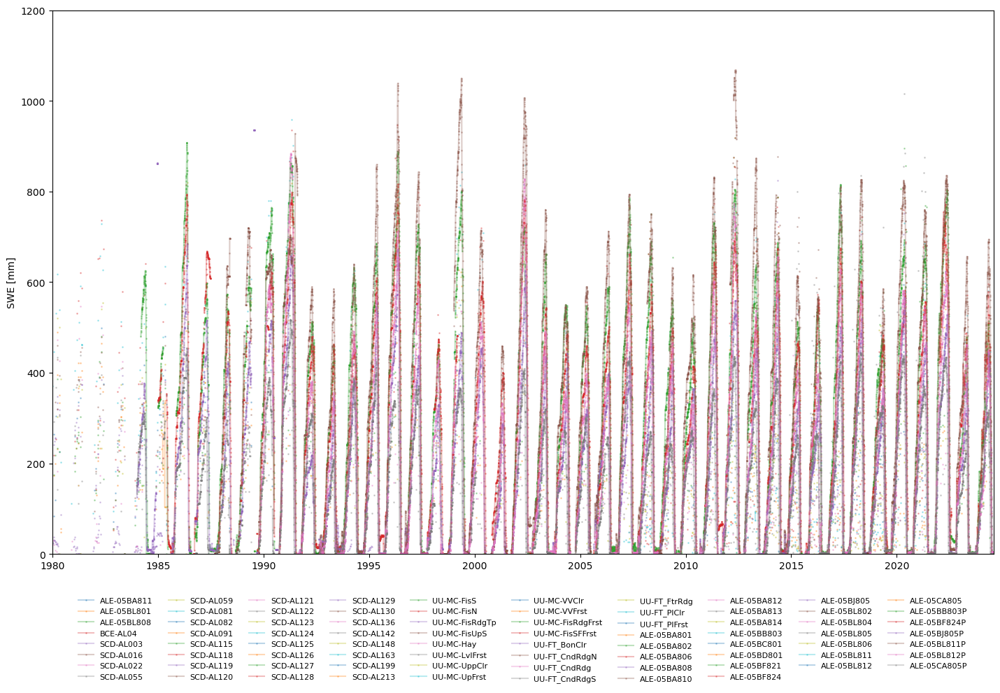

In [14]:
# Plot timeseries of SWE station observations in the test basin
fig = plt.figure(figsize=(15,10))

for s in SWE_stations_ds.station_id.values:
    SWE_stations_ds.snw.sel(station_id = s).plot(marker='o', alpha=.3, markersize=1, label=s)

plt.title('')
plt.ylabel('SWE [mm]')
plt.xlabel('')
plt.xlim(pd.to_datetime('1980-01-01'), pd.to_datetime('2024-07-31'))
plt.ylim(0, 1200)
# Place legend at the bottom with 5 columns per line
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.25), ncol=10, fontsize=8, frameon=False)
plt.tight_layout();

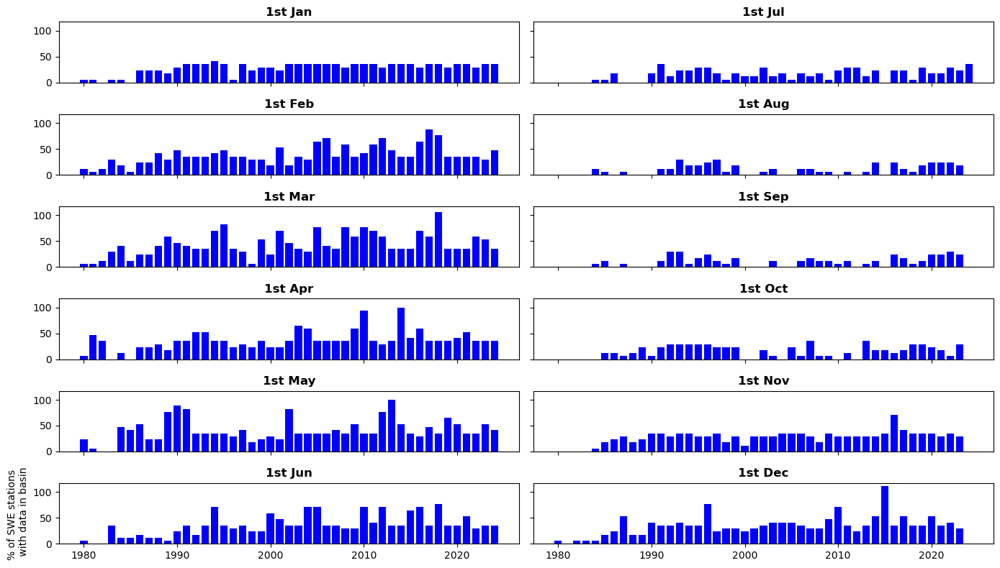

In [15]:
# Plot data availabity monthly plots

data_availability = data_availability_monthly_plots_1(SWE_stations_ds, SWE_stations_ds.snw, None, flag=0)
# Save the plot
data_availability.savefig(output_plots / 'data_availability_monthly_plots_1.png', dpi=300)

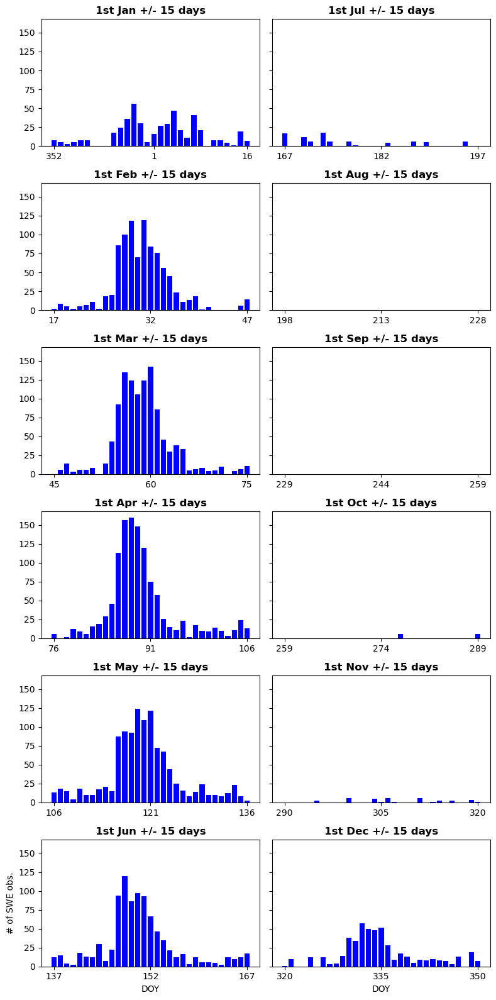

In [16]:
# Plot bar charts of the days with SWE observations around the first day of each month
fig = data_availability_monthly_plots_2(SWE_testbasin_df)

Connect CaSR SWE data to CanSWE data before linear interpolation 

In [18]:
# rename Grid_id to station_id and keep SWE, 'time', 'station_id'
casr_df = casr_df[['time', 'Grid_id','SWE']]
casr_df.rename(columns={'Grid_id': 'station_id','time':'date'}, inplace=True)
display(casr_df.head())

,date,station_id,SWE
0,1980-10-10,1,0.878418
1,1982-07-19,1,0.515625
2,1983-10-12,2,6.875000
3,1980-12-11,2,118.125000
4,1981-07-21,2,0.000000


In [19]:
# Check column names to ensure 'date' exists
print(casr_df.columns)

# Pivot the CaSR DataFrame to have dates as index and station_id as columns
casr_df = casr_df.pivot(index='date', columns='station_id', values='SWE')

# Optionally, rename the columns to a simple format if needed
casr_df.columns = [f'ext_{i+1}' for i in range(len(casr_df.columns))]

display(casr_df)

Index(['date', 'station_id', 'SWE'], dtype='object')


,ext_1,ext_2,ext_3,ext_4,ext_5,ext_6,ext_7,ext_8,ext_9,ext_10,...,ext_106,ext_107,ext_108,ext_109,ext_110,ext_111,ext_112,ext_113,ext_114,ext_115
date,,,,,,,,,,,,,,,,,,,,,
1980-01-01,110.3750,129.0625,126.0000,95.1875,112.2500,76.7500,61.1875,71.2500,71.1875,64.250,...,27.6250,9.187500,4.875000,4.415527,14.3750,15.3750,25.7500,18.8750,23.7500,28.1875
1980-01-02,110.7500,129.3750,126.2500,95.5000,112.7500,77.3125,62.0000,71.7500,72.0000,65.000,...,28.8125,11.312500,7.125000,7.312500,17.6250,17.5625,27.6250,21.3750,26.4375,30.0000
1980-01-03,109.5625,127.8125,124.4375,93.8750,111.3750,76.3750,60.9375,71.7500,70.5625,64.250,...,26.3750,8.254395,6.375366,4.901489,14.5000,15.6250,25.7500,18.2500,23.4375,27.2500
1980-01-04,109.0625,127.5000,123.6875,93.1250,111.0625,76.0625,60.3750,71.6875,69.8125,63.750,...,24.4375,6.312500,4.437500,4.062500,13.5000,13.8750,24.0625,16.3750,21.3750,25.2500
1980-01-05,108.0625,126.0000,122.1875,91.5625,109.8750,75.1875,59.2500,71.1250,68.8125,63.000,...,23.3125,4.687500,3.250000,2.875000,11.5625,12.5000,22.6250,14.5625,19.3125,23.4375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,75.6250,83.3750,77.8750,56.8750,68.1250,48.2500,37.5000,72.0000,41.3750,44.375,...,14.1250,0.895996,0.257812,1.032227,15.2500,10.6250,17.5000,16.3750,17.5000,16.0000
2024-12-28,76.8750,84.3750,79.6250,58.3750,69.6250,49.6250,38.7500,74.0000,42.6250,45.875,...,14.8750,0.755859,0.375488,0.385254,15.6250,10.5000,18.1250,17.1250,18.1250,16.8750
2024-12-29,78.0000,85.6250,80.7500,59.3750,71.0000,50.7500,39.7500,75.6250,43.3750,47.000,...,15.2500,0.500000,0.375000,0.625000,16.0000,10.7500,18.5000,17.5000,18.5000,17.1250


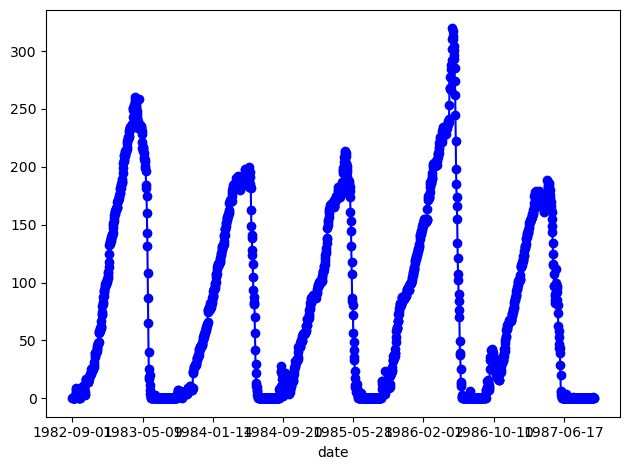

In [20]:
# Visual check
casr_df['ext_5']['1982-09-01':'1987-10-02'].plot(marker='o', color='b')
plt.tight_layout();

In [21]:
SWE_stations_ds['time'] = pd.date_range(start='1980-01-01', periods=SWE_stations_ds.dims['time'], freq='D')
# Linear interpolation to fill in small data gaps
SWE_testbasin_interp_da = SWE_stations_ds.snw.interpolate_na(method='linear', dim='time', max_gap=datetime.timedelta(days=max_gap_days_default))
# Only drop columns that exist
df_interp = SWE_testbasin_interp_da.to_dataframe()
cols_to_drop = [col for col in ['lon', 'lat', 'station_name'] if col in df_interp.columns]
SWE_obs_basin_interp_df = df_interp.drop(columns=cols_to_drop).unstack()['snw'].T
SWE_obs_basin_interp_df['date'] = SWE_obs_basin_interp_df.index.normalize()
SWE_obs_basin_interp_df = SWE_obs_basin_interp_df.set_index('date')
display(SWE_obs_basin_interp_df)

C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_33096\2473380290.py:1: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  SWE_stations_ds['time'] = pd.date_range(start='1980-01-01', periods=SWE_stations_ds.dims['time'], freq='D')


station_id,ALE-05BA811,ALE-05BL801,ALE-05BL808,BCE-AL04,SCD-AL003,SCD-AL016,SCD-AL022,SCD-AL055,SCD-AL059,SCD-AL081,...,ALE-05BL806,ALE-05BL811,ALE-05BL812,ALE-05CA805,ALE-05BB803P,ALE-05BF824P,ALE-05BJ805P,ALE-05BL811P,ALE-05BL812P,ALE-05CA805P
date,,,,,,,,,,,,,,,,,,,,,
1980-01-01,NaN,NaN,NaN,NaN,25.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-02,NaN,NaN,NaN,NaN,25.285715,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-03,NaN,NaN,NaN,NaN,25.571428,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-04,NaN,NaN,NaN,NaN,25.857143,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-05,NaN,NaN,NaN,NaN,26.142857,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,0.0,NaN,NaN,3.0,0.0
2024-07-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,0.0,NaN,NaN,3.0,0.0
2024-07-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,0.0,NaN,NaN,3.0,0.0


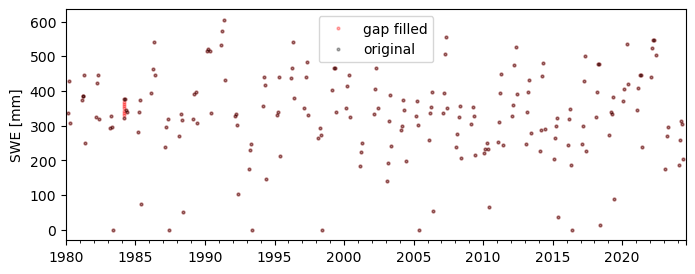

In [27]:
plt.figure(figsize=(8,3))
SWE_obs_basin_interp_df.iloc[:,55].plot(color='r', marker='o', ms=2, label='gap filled', lw=0, alpha=.3)
SWE_testbasin_df.iloc[:,55].plot(color='k', marker='o', ms=2, label='original', lw=0, alpha=.3)
plt.xlabel('')
plt.ylabel('SWE [mm]')
plt.legend();

In [22]:
# Save flags for linear interpolation to a new Pandas dataframe (observations = 0; estimates = 1)
flags_interp_testbasin_da = SWE_testbasin_interp_da.copy().fillna(-999)
original_da = SWE_stations_ds.snw.copy().fillna(-999)
flags_interp_testbasin_da = xr.where(flags_interp_testbasin_da==original_da, 0, 1)
# Only drop columns that exist in the DataFrame
cols_to_drop = [col for col in ['lon', 'lat', 'station_name'] if col in flags_interp_testbasin_da.to_dataframe().columns]
flags_interp_testbasin_df = flags_interp_testbasin_da.to_dataframe().drop(columns=cols_to_drop).unstack()['snw'].T
flags_interp_testbasin_df['date'] =  flags_interp_testbasin_df.index.normalize()
flags_interp_testbasin_df = flags_interp_testbasin_df.set_index('date')
display(SWE_testbasin_interp_da)

<xarray.DataArray 'snw' (station_id: 78, time: 16284)> Size: 5MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ...,  3.,  3.,  3.],
       [nan, nan, nan, ...,  0.,  0.,  0.]], dtype=float32)
Coordinates:
  * station_id  (station_id) <U16 5kB 'ALE-05BA811' ... 'ALE-05CA805P'
  * time        (time) datetime64[ns] 130kB 1980-01-01 1980-01-02 ... 2024-07-31
Attributes:
    long_name:      Water equivalent of snow cover
    standard_name:  surface_snow_amount
    units:          kg m**-2

In [23]:
# Merge test basin SWE and casr_df
# First, ensure both dataframes have matching DatetimeIndex
print(f"SWE_obs_basin_interp_df index type: {type(SWE_obs_basin_interp_df.index)}")
print(f"casr_df index type: {type(casr_df.index)}")
print(f"SWE_obs_basin_interp_df index sample: {SWE_obs_basin_interp_df.index[:3]}")
print(f"casr_df index sample: {casr_df.index[:3]}")

# Convert casr_df index to DatetimeIndex if it's not already
if not isinstance(casr_df.index, pd.DatetimeIndex):
    casr_df.index = pd.to_datetime(casr_df.index)
    print("Converted casr_df.index to DatetimeIndex")

# Ensure both indices are aligned (remove any timezone info if present)
SWE_obs_basin_interp_df.index = pd.to_datetime(SWE_obs_basin_interp_df.index).normalize()
casr_df.index = pd.to_datetime(casr_df.index).normalize()

print(f"\nAfter conversion:")
print(f"SWE_obs_basin_interp_df index type: {type(SWE_obs_basin_interp_df.index)}")
print(f"casr_df index type: {type(casr_df.index)}")

SWE_testbasin_interp_df = SWE_obs_basin_interp_df.merge(casr_df, left_index=True, right_index=True, how='outer', suffixes=('_testbasin', '_casr'))

print(f"\nOriginal SWE columns: {len(SWE_obs_basin_interp_df.columns)}")
print(f"CaSR columns: {len(casr_df.columns)}")
print(f"Merged columns: {len(SWE_testbasin_interp_df.columns)}")
print(f"Merged data shape: {SWE_testbasin_interp_df.shape}")
print(f"Missing values per column:\n{SWE_testbasin_interp_df.isnull().sum()}")

display(SWE_testbasin_interp_df)

SWE_obs_basin_interp_df index type: <class 'pandas.core.indexes.datetimes.DatetimeIndex'>
casr_df index type: <class 'pandas.core.indexes.base.Index'>
SWE_obs_basin_interp_df index sample: DatetimeIndex(['1980-01-01', '1980-01-02', '1980-01-03'], dtype='datetime64[ns]', name='date', freq=None)
casr_df index sample: Index(['1980-01-01', '1980-01-02', '1980-01-03'], dtype='object', name='date')
Converted casr_df.index to DatetimeIndex

After conversion:
SWE_obs_basin_interp_df index type: <class 'pandas.core.indexes.datetimes.DatetimeIndex'>
casr_df index type: <class 'pandas.core.indexes.datetimes.DatetimeIndex'>

Original SWE columns: 78
CaSR columns: 257
Merged columns: 335
Merged data shape: (16437, 335)
Missing values per column:
ALE-05BA811    16433
ALE-05BL801    16437
ALE-05BL808    16428
BCE-AL04       16437
SCD-AL003      15660
               ...  
ext_253            0
ext_254            0
ext_255            0
ext_256            0
ext_257            0
Length: 335, dtype: int64


,ALE-05BA811,ALE-05BL801,ALE-05BL808,BCE-AL04,SCD-AL003,SCD-AL016,SCD-AL022,SCD-AL055,SCD-AL059,SCD-AL081,...,ext_248,ext_249,ext_250,ext_251,ext_252,ext_253,ext_254,ext_255,ext_256,ext_257
date,,,,,,,,,,,,,,,,,,,,,
1980-01-01,NaN,NaN,NaN,NaN,25.000000,NaN,NaN,NaN,NaN,NaN,...,32.0625,28.3125,37.0000,35.8125,30.6250,5.250000,5.4375,3.562500,3.8125,6.6875
1980-01-02,NaN,NaN,NaN,NaN,25.285715,NaN,NaN,NaN,NaN,NaN,...,34.0000,32.7500,39.2500,40.1250,34.9375,6.187500,6.3750,4.375000,4.5000,7.2500
1980-01-03,NaN,NaN,NaN,NaN,25.571428,NaN,NaN,NaN,NaN,NaN,...,36.6875,35.4375,41.9375,43.1250,37.6875,6.625000,7.1250,4.687500,4.7500,7.5625
1980-01-04,NaN,NaN,NaN,NaN,25.857143,NaN,NaN,NaN,NaN,NaN,...,38.3125,37.0625,43.5000,44.4375,39.2500,7.937500,8.3750,6.062500,6.6250,9.1250
1980-01-05,NaN,NaN,NaN,NaN,26.142857,NaN,NaN,NaN,NaN,NaN,...,39.4375,37.8125,44.7500,44.8750,39.8125,7.187500,7.7500,5.312500,5.7500,8.2500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13.6250,26.0000,14.2500,16.6250,20.5000,0.775391,9.2500,0.517578,5.8750,15.2500
2024-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13.7500,25.3750,14.2500,16.2500,20.0000,0.382324,10.0000,0.875000,6.1250,14.7500
2024-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,14.0000,25.0000,14.3750,16.1250,19.7500,0.750000,10.8750,1.000000,6.2500,14.8750


In [24]:
start_date = pd.to_datetime("1980-01-01")
end_date = pd.to_datetime("2024-07-31")
chunk_years = 5

# Initialize output dataframes
all_SWE_obs = []
all_flags = []
all_donors = []

current_start = start_date

while current_start < end_date:
    current_end = min(current_start + pd.DateOffset(years=chunk_years), end_date)
    
    print(f"Processing chunk: {current_start.date()} to {current_end.date()}")

    chunk_df = SWE_testbasin_interp_df.loc[current_start:current_end].copy()
    
    # Ensure the index is a DatetimeIndex
    if not isinstance(chunk_df.index, pd.DatetimeIndex):
        chunk_df.index = pd.to_datetime(chunk_df.index)
    
    SWE_obs_chunk, flags_chunk, donors_chunk = qm_gap_filling(
        chunk_df,
        window_days=window_days_default,
        min_obs_corr=min_obs_corr_default,
        min_obs_cdf=min_obs_cdf_default,
        min_corr=min_corr_default
    )

    all_SWE_obs.append(SWE_obs_chunk)
    all_flags.append(flags_chunk)
    all_donors.append(donors_chunk)

    current_start = current_end + pd.DateOffset(days=1)

# Combine the parts
SWE_obs_basin_gapfilled_df = pd.concat(all_SWE_obs)
flags_gapfill_basin_df = pd.concat(all_flags)
donor_stations_gapfill_basin_df = pd.concat(all_donors)

Processing chunk: 1980-01-01 to 1985-01-01


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Dat

Processing chunk: 1985-01-02 to 1990-01-02


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:595: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '193.78' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  gapfilled_data.loc[d,target_station] = value_target
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:597: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'ext_17' has dtype incompatible with float64, please explicitly cast to

Processing chunk: 1990-01-03 to 1995-01-03


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:595: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '156.81' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  gapfilled_data.loc[d,target_station] = value_target
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:597: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'ext_21' has dtype incompatible with float64, please explicitly cast to

Processing chunk: 1995-01-04 to 2000-01-04


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:595: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '21.7' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  gapfilled_data.loc[d,target_station] = value_target
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:597: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'ALE-05BL811P' has dtype incompatible with float64, please explicitly cas

Processing chunk: 2000-01-05 to 2005-01-05


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:595: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '316.65' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  gapfilled_data.loc[d,target_station] = value_target
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:597: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'ext_31' has dtype incompatible with float64, please explicitly cast to

Processing chunk: 2005-01-06 to 2010-01-06


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:595: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '49.42' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  gapfilled_data.loc[d,target_station] = value_target
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:597: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'ext_1' has dtype incompatible with float64, please explicitly cast to a

Processing chunk: 2010-01-07 to 2015-01-07


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:595: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '58.87' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  gapfilled_data.loc[d,target_station] = value_target
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:597: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'ALE-05BB803P' has dtype incompatible with float64, please explicitly ca

Processing chunk: 2015-01-08 to 2020-01-08


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:595: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '282.44' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  gapfilled_data.loc[d,target_station] = value_target
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:597: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'ext_221' has dtype incompatible with float64, please explicitly cast t

Processing chunk: 2020-01-09 to 2024-07-31


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:589: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  value_donor = sorted_data_window[donor_station].dropna()[0]
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:595: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '205.37' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  gapfilled_data.loc[d,target_station] = value_target
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_1172\2754554537.py:597: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'ALE-05BL811P' has dtype incompatible with float64, please explicitly c

In [25]:
# Combine linear interpolation and quantile mapping flags into a single Pandas dataframe
#if not flags_interp_basin_df.index.equals(flags_gapfill_basin_df.index) or not flags_interp_basin_df.columns.equals(flags_gapfill_basin_df.columns):
flags_basin_df = SWE_obs_basin_interp_df + flags_gapfill_basin_df

display(flags_basin_df)

station_id,ALE-05BA811,ALE-05BL801,ALE-05BL808,BCE-AL04,SCD-AL003,SCD-AL016,SCD-AL022,SCD-AL055,SCD-AL059,SCD-AL081,...,ALE-05BL806,ALE-05BL811,ALE-05BL812,ALE-05CA805,ALE-05BB803P,ALE-05BF824P,ALE-05BJ805P,ALE-05BL811P,ALE-05BL812P,ALE-05CA805P
date,,,,,,,,,,,,,,,,,,,,,
1980-01-01,NaN,NaN,NaN,NaN,25.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-02,NaN,NaN,NaN,NaN,25.285715,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-03,NaN,NaN,NaN,NaN,25.571428,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-04,NaN,NaN,NaN,NaN,25.857143,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-05,NaN,NaN,NaN,NaN,26.142857,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,0.0,NaN,NaN,3.0,0.0
2024-07-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,0.0,NaN,NaN,3.0,0.0
2024-07-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,0.0,NaN,NaN,3.0,0.0


In [26]:
# Combine gap filled dataset and metadata into a single dataset
SWE_P_gapfill_testbasin_da = xr.DataArray(data=SWE_obs_basin_gapfilled_df.values, coords=dict(time=SWE_obs_basin_gapfilled_df.index.values, station_id=SWE_obs_basin_gapfilled_df.columns.values), dims=['time','station_id'], name='SWE', attrs={'long_name':'Surface snow water equivalent','units':'kg m**-2'})
flags_testbasin_da = xr.DataArray(data=flags_basin_df.values, coords=dict(time=flags_basin_df.index.values, station_id=flags_basin_df.columns.values), dims=['time','station_id'], name='flag', attrs={'description':'observations = 0; estimates = 1'})
donor_stations_gapfill_testbasin_da = xr.DataArray(data=donor_stations_gapfill_basin_df.values, coords=dict(time=donor_stations_gapfill_basin_df.index.values, station_id=donor_stations_gapfill_basin_df.columns.values), dims=['time','station_id'], name='donor_stations', attrs={'description':'station_id of donor stations used for gap filling'})
SWE_testbasin_gapfilled_ds = xr.merge([SWE_P_gapfill_testbasin_da, flags_testbasin_da, donor_stations_gapfill_testbasin_da])
# Only assign coordinates for station_ids present in SWE_stations_ds
station_ids_all = SWE_obs_basin_gapfilled_df.columns.values
station_ids_in_ds = [sid for sid in station_ids_all if sid in SWE_stations_ds.station_id.values]
station_ids_not_in_ds = [sid for sid in station_ids_all if sid not in SWE_stations_ds.station_id.values]

# Prepare arrays for lat, lon, and station_name, filling with NaN or empty string for missing stations
lats = []
lons = []
names = []
for sid in station_ids_all:
	if sid in SWE_stations_ds.station_id.values:
		lat_val = SWE_stations_ds.sel(station_id=sid).lat.values
		lon_val = SWE_stations_ds.sel(station_id=sid).lon.values
		name_val = SWE_stations_ds.sel(station_id=sid).station_name.values
		# If returned value is an array, get the first element
		if isinstance(lat_val, np.ndarray):
			lat_val = lat_val.item() if lat_val.size == 1 else lat_val[0]
		if isinstance(lon_val, np.ndarray):
			lon_val = lon_val.item() if lon_val.size == 1 else lon_val[0]
		if isinstance(name_val, np.ndarray):
			name_val = name_val.item() if name_val.size == 1 else name_val[0]
		lats.append(float(lat_val))
		lons.append(float(lon_val))
		names.append(str(name_val))
	else:
		lats.append(np.nan)
		lons.append(np.nan)
		names.append("")

SWE_testbasin_gapfilled_ds = SWE_testbasin_gapfilled_ds.assign_coords({'lat':('station_id',lats),'lon':('station_id',lons),'station_name':('station_id',names)})

display(SWE_testbasin_gapfilled_ds)
display(flags_testbasin_da)

<xarray.Dataset> Size: 31MB
Dimensions:         (time: 16284, station_id: 78)
Coordinates:
  * time            (time) datetime64[ns] 130kB 1980-01-01 ... 2024-07-31
  * station_id      (station_id) object 624B 'ALE-05BA811' ... 'ALE-05CA805P'
    lat             (station_id) float64 624B 51.7 50.6 50.48 ... 50.49 51.54
    lon             (station_id) float64 624B -116.5 -115.0 ... -114.9 -116.1
    station_name    (station_id) <U32 10kB 'BOW SUMMIT (OLD)' ... 'SKOKI LODG...
Data variables:
    SWE             (time, station_id) float64 10MB nan nan nan ... 0.85 3.0 0.0
    flag            (time, station_id) float64 10MB nan nan nan ... nan 3.0 0.0
    donor_stations  (time, station_id) object 10MB nan nan nan ... nan nan
Attributes:
    long_name:  Surface snow water equivalent
    units:      kg m**-2

<xarray.DataArray 'flag' (time: 16284, station_id: 78)> Size: 10MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan,  3.,  0.],
       [nan, nan, nan, ..., nan,  3.,  0.],
       [nan, nan, nan, ..., nan,  3.,  0.]])
Coordinates:
  * time        (time) datetime64[ns] 130kB 1980-01-01 1980-01-02 ... 2024-07-31
  * station_id  (station_id) object 624B 'ALE-05BA811' ... 'ALE-05CA805P'
Attributes:
    description:  observations = 0; estimates = 1

In [27]:
# Save the gap-filled dataset to NetCDF
SWE_testbasin_gapfilled_ds.SWE.to_netcdf(output_data / 'bow_swe_gapfilled_data_only.nc')

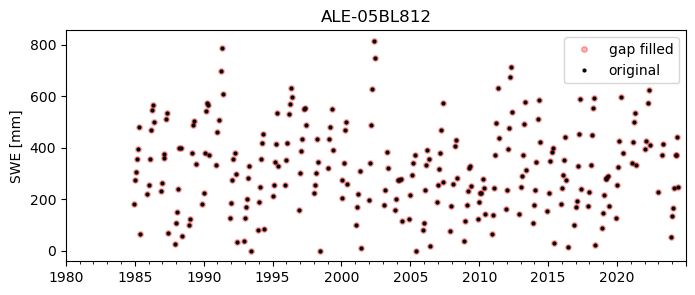

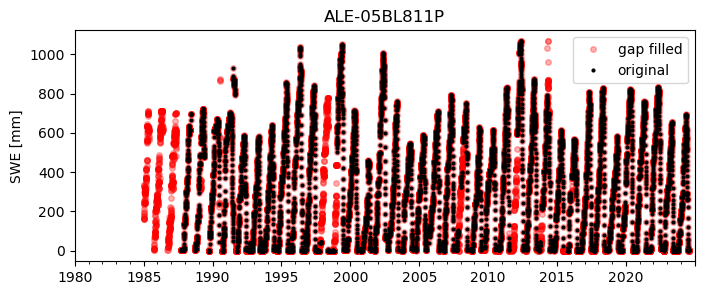

In [29]:
# Plot the first SWE station in the dataset to visually check gap filling results

# Ensure both dataframes have a DatetimeIndex for plotting
if not isinstance(SWE_obs_basin_gapfilled_df.index, pd.DatetimeIndex):
	SWE_obs_basin_gapfilled_df.index = pd.to_datetime(SWE_obs_basin_gapfilled_df.index)
if not isinstance(SWE_testbasin_interp_df.index, pd.DatetimeIndex):
	SWE_testbasin_interp_df.index = pd.to_datetime(SWE_testbasin_interp_df.index)

plt.figure(figsize=(8,3))
SWE_obs_basin_gapfilled_df.iloc[:,70].plot(color='r', marker='o', ms=4, label='gap filled', lw=0, alpha=.3)
SWE_testbasan_interp_series_1 = SWE_testbasin_interp_df.iloc[:,70]
SWE_testbasan_interp_series_1.plot(color='k', marker='o', ms=2, label='original', lw=0)
plt.title(SWE_testbasan_interp_series_1.name)
plt.xlabel('')
plt.ylabel('SWE [mm]')
plt.legend();

plt.figure(figsize=(8,3))
SWE_obs_basin_gapfilled_df.iloc[:,75].plot(color='r', marker='o', ms=4, label='gap filled', lw=0, alpha=.3)
SWE_testbasan_interp_series_2 = SWE_testbasin_interp_df.iloc[:,75]
SWE_testbasan_interp_series_2.plot(color='k', marker='o', ms=2, label='original', lw=0)
plt.title(SWE_testbasan_interp_series_2.name)
plt.xlabel('')
plt.ylabel('SWE [mm]')
plt.legend();
plt.savefig(output_plots / 'gap_filling_example_Station-ALE-05BL811P.png', dpi=300)

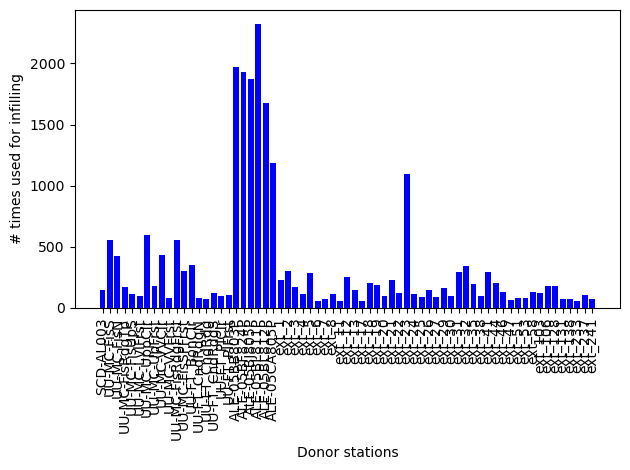

In [30]:
# Plot a bar chart of the number of times each donor station was used for infilling
count = []

for s in SWE_testbasin_interp_df.columns.values:
    count_s = SWE_testbasin_gapfilled_ds.donor_stations.where(SWE_testbasin_gapfilled_ds.donor_stations==s).count().data
    count.append(count_s)
# drop stations that were never used for infilling
SWE_testbasin_interp_df = SWE_testbasin_interp_df.loc[:, [s for s, c in zip(SWE_testbasin_interp_df.columns.values, count) if c > 50]]
count = [c for c in count if c > 50]

fig = plt.figure()
plt.bar(SWE_testbasin_interp_df.columns.values, count, color='b')
plt.xticks(rotation=90)
plt.xlabel('Donor stations')
plt.ylabel('# times used for infilling')
plt.tight_layout();

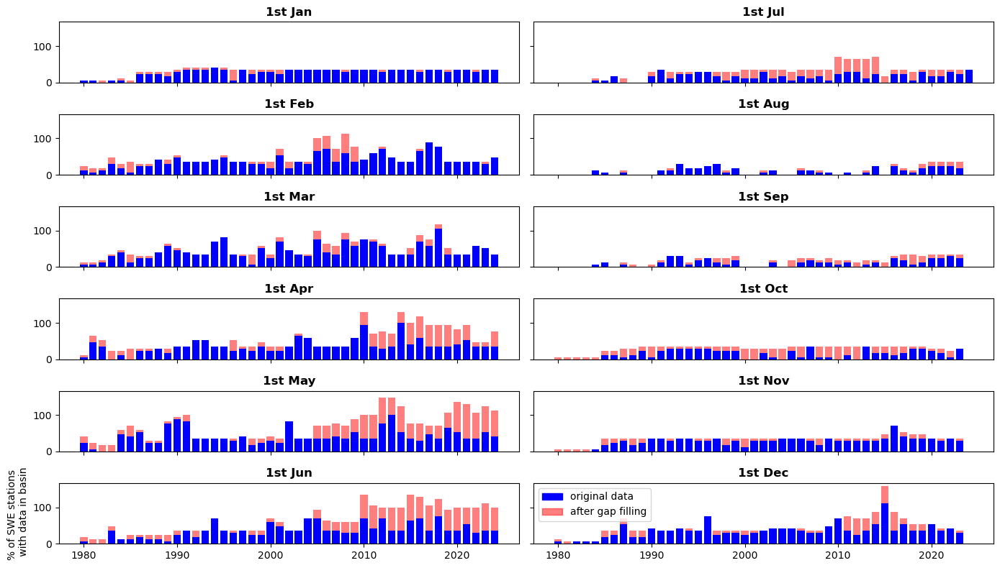

In [34]:
# Plot timeseries of the % of SWE stations with data in the test basin on the first day of each month, for the original data & after gap filling (flag=1)
# Filter out external stations (ext_) from gap-filled data to match the original station count
non_ext_stations = [sid for sid in SWE_testbasin_gapfilled_ds.station_id.values if not str(sid).startswith('ext_')]
SWE_gapfilled_filtered = SWE_testbasin_gapfilled_ds.SWE.sel(station_id=non_ext_stations)

fig = data_availability_monthly_plots_1(SWE_stations_ds, SWE_stations_ds.snw, SWE_gapfilled_filtered, flag=1)

# Save the plot
fig.savefig(output_plots / 'data_availability_monthly_plots_gapfilled.png', dpi=300)


## 6. Summary

In this notebook, we've demonstrated the data preparation workflow for the Snow Drought Index package. We've loaded data, preprocessed it, extracted stations within the basin of interest, assessed data availability, and saved the processed data for use in subsequent analyses.

The workflow uses the following key functions from the `data_preparation` module:
- `load_swe_data()`, `load_precip_data()`, `load_basin_data()` for data loading
- `preprocess_swe()`, `preprocess_precip()` for data preprocessing
- `convert_to_geodataframe()` for converting data to GeoDataFrame
- `extract_stations_in_basin()` for extracting stations within a basin
- `filter_stations()` for filtering data by station
- `assess_data_availability()` for assessing data availability

These functions provide a standardized and reusable way to prepare data for the Snow Drought Index calculations.